In [1]:
import random

import torch
from torch import nn
from torchvision import datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader
from torch.optim import Adam, SGD
import numpy as np
import matplotlib as mpl
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torcheval.metrics import FrechetInceptionDistance

from modelsv2_no_label import NetD, NetG

In [2]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
display(f'Device {device} is available.')

manual_seed = 999
torch.manual_seed(manual_seed)
random.seed(manual_seed)
#torch.use_deterministic_algorithms(True)

'Device cuda is available.'

In [3]:
dc_gen = NetG().to(device)
dc_dis = NetD().to(device)

batch_size = 128
#lr = 0.0002
lr = 0.0002
epochs = 50
loss_fn = nn.BCELoss()
fixed_noise = torch.randn((64, 100, 1,1), device=device)
fixed_labels = torch.randint(0,10, (64,1)).to(device)
# Other normalization factors are located here:  https://github.com/kuangliu/pytorch-cifar/issues/19
transform = transforms.Compose([transforms.Resize(64), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = DataLoader(datasets.CIFAR10(root='./hw4data', train=True, transform=transform, download=True), batch_size=batch_size,shuffle=True)
test_loader =  DataLoader(datasets.CIFAR10(root='./hw4data', train=False, transform=transform, download=True), batch_size=batch_size,shuffle=True)

gen_optimizer = Adam(dc_gen.parameters(), lr=lr, betas=(.5, .999))
dis_optimizer = Adam(dc_dis.parameters(), lr=lr, betas=(.5, .999))
#dis_optimizer = SGD(dc_dis.parameters(), lr=lr) 

Files already downloaded and verified
Files already downloaded and verified


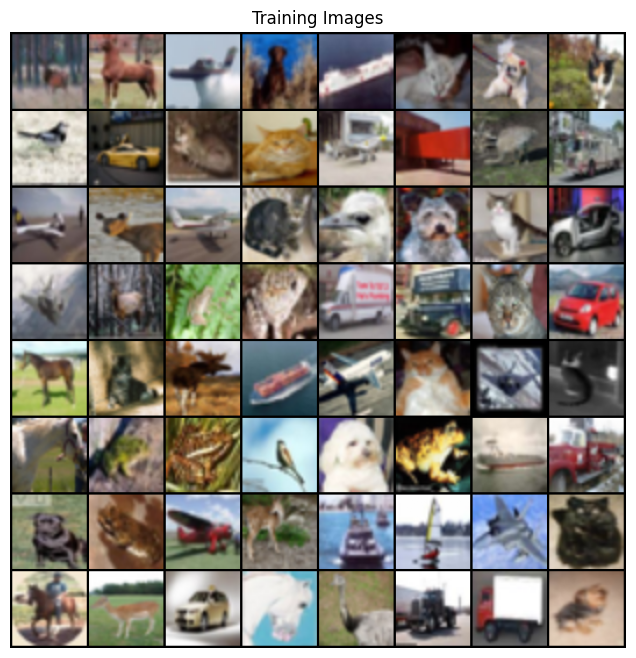

In [4]:
data = next(iter(train_loader))
data[0].shape

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(data[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


In [5]:

def init_weights(m):
    """Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. """
    clazz = m.__class__.__name__
    if clazz.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif clazz.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

dc_gen.apply(init_weights)
dc_dis.apply(init_weights)

display(dc_gen)
display(dc_dis)



NetG(
  (embedding): Embedding(10, 100)
  (sequence): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bi

NetD(
  (embedding): Embedding(10, 512)
  (sequence): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (last_conv2d): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (flatten): Fla

In [6]:
def train(g, d, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch):
    derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2= [],[], [], [],[], []
    fid = FrechetInceptionDistance(device = device)
    for idx, data in enumerate(train_loader):    
        g.train()
        d.train()
        
        fid.update((data[0]-data[0].min())/(data[0].max()-data[0].min()), is_real=True)
        d.zero_grad()
        imgs = data[0].to(device)
        batch_size = imgs.size(0)
        label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        # Real images with discriminator
        output = d(imgs, data[1].to(device))
        d_real_error = loss_fn(output.squeeze(), label)
        d_real_error.backward()      
        dx.append(output.mean().item())

        # Fake images with discriminator
        zvector = torch.randn((batch_size, 100, 1, 1), device=device)
        fakes = g(zvector, data[1].to(device))
        output = d(fakes.detach(), data[1].to(device))
        bad_label = torch.full((batch_size,), 0, dtype=torch.float, device=device)
        d_fake_error = loss_fn(output.squeeze(),bad_label)
        d_fake_error.backward()
        d_g_x1.append(output.mean().item())
        
        #(d_real_error + d_fake_error).backward()

        dis_optimizer.step()
        total_Derror = d_fake_error + d_real_error
        #total_Derror.backward()
        derrors.append(total_Derror.item())
        

        # Do the loss of G
        g.zero_grad()
        trick_label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        #fakes = g(zvector)
        output = d(fakes, data[1].to(device))
        g_error = loss_fn(output.squeeze(), trick_label)
        gerrors.append(g_error.item())
        #print(g_error)
        g_error.backward()
        gen_optimizer.step()
        d_g_x2.append(output.mean().item())

        if idx == (len(train_loader) -1) and (epoch+1) % 5 == 0:
            with torch.no_grad():
                g.eval()
                #torch.randint(0,10, (64,1)).to(device).detach().cpu()
                extra_fake = g(fixed_noise, fixed_labels) #data[1].to(device)).detach().cpu()
                gen_imgs.append(vutils.make_grid(extra_fake, padding=2, normalize=True))
                
                fig = plt.figure(figsize=(8,8))
                plt.axis("off")
                plt.imshow(np.transpose(vutils.make_grid(fakes, padding=2, normalize=True).cpu(), (2,1,0)))
                plt.show()
                plt.close(fig)
                
        if idx == (len(train_loader) -1):
            fid.update((fakes-fakes.min())/(fakes.max()-fakes.min()), is_real=False)
        
    return derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2, fid.compute().item()

epoch: 0, D_Loss: 0.6826537717943606, G_Loss: 6.38528966354897, Dx: 0.7908416739891252, D_G_x1: 0.11292728720315093, D_G_x2: 0.011263278327187286, FID: 379.5960693359375
epoch: 1, D_Loss: 0.7922487237569317, G_Loss: 3.7758816867838125, Dx: 0.7333146918688893, D_G_x1: 0.1595812156862553, D_G_x2: 0.05443366262199533, FID: 240.26280212402344
epoch: 2, D_Loss: 0.7938294364973102, G_Loss: 3.2759801227113474, Dx: 0.717436447930153, D_G_x1: 0.1793631325848639, D_G_x2: 0.062281035184425536, FID: 207.18939208984375
epoch: 3, D_Loss: 0.8714595655041277, G_Loss: 2.842353630248848, Dx: 0.6890522852216078, D_G_x1: 0.20825560466247037, D_G_x2: 0.09250771916908203, FID: 134.56179809570312


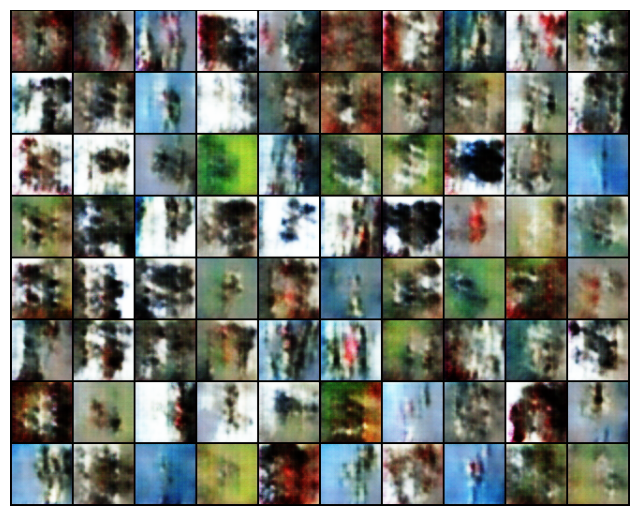

epoch: 4, D_Loss: 0.8435980132626145, G_Loss: 2.864331690856563, Dx: 0.6938978692854915, D_G_x1: 0.20281786019163553, D_G_x2: 0.08712683694229921, FID: 120.72637939453125
epoch: 5, D_Loss: 0.8635347224867252, G_Loss: 2.5240732969530404, Dx: 0.6797550649899046, D_G_x1: 0.21648040182574096, D_G_x2: 0.11589363384563142, FID: 101.54878997802734
epoch: 6, D_Loss: 0.9431766577998696, G_Loss: 2.409242119325701, Dx: 0.6622181199872128, D_G_x1: 0.2367652834636038, D_G_x2: 0.13205422378142775, FID: 100.87043762207031
epoch: 7, D_Loss: 0.896847643815648, G_Loss: 2.4739350351836067, Dx: 0.6781350468735561, D_G_x1: 0.2205373462946976, D_G_x2: 0.12330248972574902, FID: 101.51744079589844
epoch: 8, D_Loss: 0.8774495627873998, G_Loss: 2.719229525769763, Dx: 0.7026011495472259, D_G_x1: 0.19714880210783362, D_G_x2: 0.10505709853505625, FID: 83.02455139160156


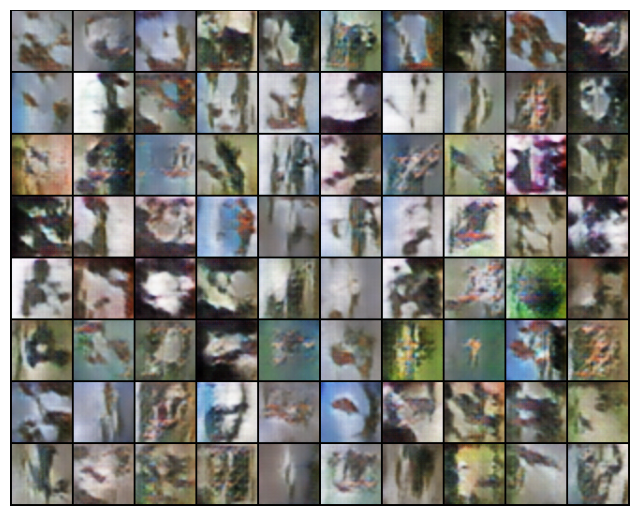

epoch: 9, D_Loss: 0.7138381757394737, G_Loss: 3.144155613220561, Dx: 0.76038005004656, D_G_x1: 0.13976906696332247, D_G_x2: 0.06703757365196458, FID: 83.5240478515625
epoch: 10, D_Loss: 0.7115815326838237, G_Loss: 3.286182225360285, Dx: 0.7704290514740416, D_G_x1: 0.1298967233525239, D_G_x2: 0.0629566699832358, FID: 90.21849060058594
epoch: 11, D_Loss: 0.8378326568152289, G_Loss: 2.8323845242142984, Dx: 0.7215386426476452, D_G_x1: 0.17774930132439543, D_G_x2: 0.10065322214096804, FID: 80.23551940917969
epoch: 12, D_Loss: 0.7299158280462865, G_Loss: 3.082596268952655, Dx: 0.7566867089113387, D_G_x1: 0.14170361640694898, D_G_x2: 0.0780503343770449, FID: 80.85589599609375
epoch: 13, D_Loss: 0.7125185446818466, G_Loss: 3.156434711669107, Dx: 0.7637709480950899, D_G_x1: 0.1365413882565992, D_G_x2: 0.07364468217571028, FID: 85.60255432128906


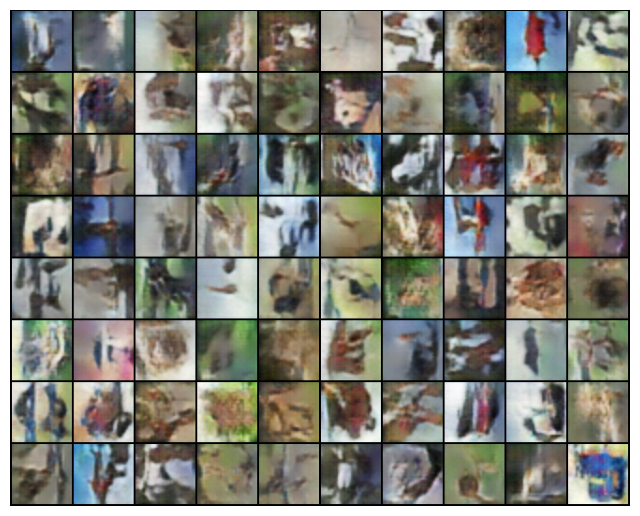

epoch: 14, D_Loss: 0.7113789289503756, G_Loss: 3.188830860206843, Dx: 0.76058585482085, D_G_x1: 0.13734165225502537, D_G_x2: 0.07636899873800397, FID: 80.08731079101562
epoch: 15, D_Loss: 0.6869313267185865, G_Loss: 3.2114200297066624, Dx: 0.7766859442367197, D_G_x1: 0.1244891068458681, D_G_x2: 0.0671313325108578, FID: 88.49638366699219
epoch: 16, D_Loss: 0.7382865213524655, G_Loss: 3.0807159795328176, Dx: 0.755005354056959, D_G_x1: 0.14410679174177443, D_G_x2: 0.07844942315544723, FID: 79.13587951660156
epoch: 17, D_Loss: 0.653491409233464, G_Loss: 3.301695659337446, Dx: 0.7861296986241627, D_G_x1: 0.11410341214488649, D_G_x2: 0.06018737521510252, FID: 79.88990783691406
epoch: 18, D_Loss: 0.7038278360958294, G_Loss: 3.2387957734525052, Dx: 0.7699796257402434, D_G_x1: 0.1293875253842691, D_G_x2: 0.07365033500116257, FID: 73.1925048828125


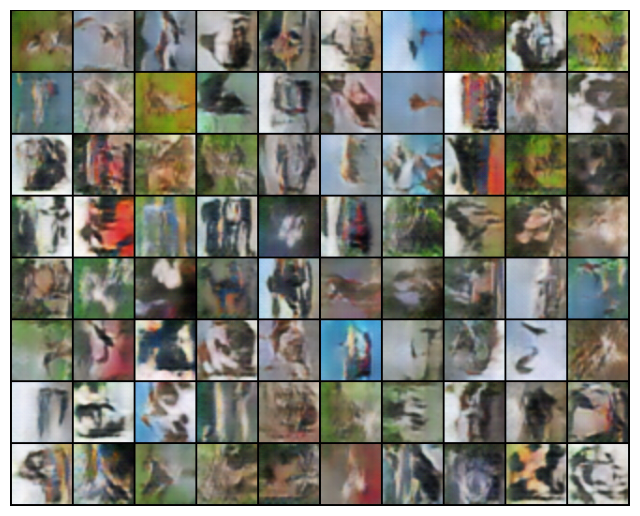

epoch: 19, D_Loss: 0.6658341771044085, G_Loss: 3.2120199145563424, Dx: 0.7789855054996507, D_G_x1: 0.12069695952462742, D_G_x2: 0.07119709751917087, FID: 78.38401794433594
epoch: 20, D_Loss: 0.6573769454760929, G_Loss: 3.315837468485088, Dx: 0.7847294264908908, D_G_x1: 0.11440038545738401, D_G_x2: 0.06427067425950547, FID: 77.96195983886719
epoch: 21, D_Loss: 0.552528525023814, G_Loss: 3.7415039011889406, Dx: 0.8191785925899244, D_G_x1: 0.080781609795647, D_G_x2: 0.04268533546563007, FID: 77.4171142578125
epoch: 22, D_Loss: 0.6941520424602586, G_Loss: 3.0295938151266872, Dx: 0.7634350652318171, D_G_x1: 0.13461007041644657, D_G_x2: 0.08090396763225707, FID: 76.43612670898438
epoch: 23, D_Loss: 0.6463817117921532, G_Loss: 3.3954052736844553, Dx: 0.7926062811166048, D_G_x1: 0.10745141632839159, D_G_x2: 0.06108119638304434, FID: 81.34034729003906


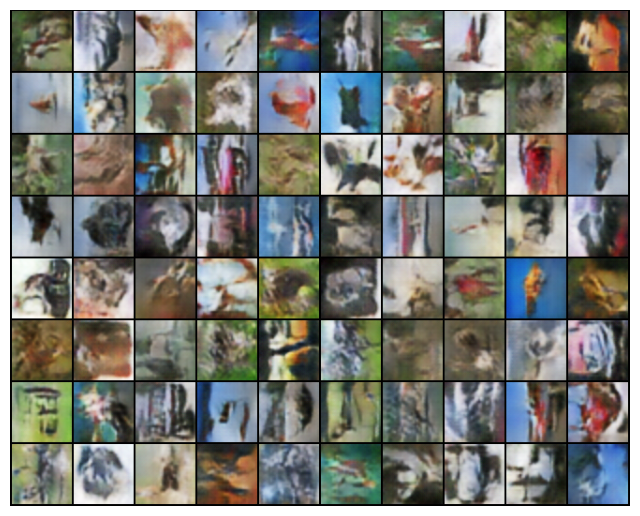

epoch: 24, D_Loss: 0.6157406073092194, G_Loss: 3.32768321189734, Dx: 0.7950318124993225, D_G_x1: 0.10350653103402699, D_G_x2: 0.05901842527611055, FID: 76.27790832519531
epoch: 25, D_Loss: 0.6675093414838357, G_Loss: 3.1837698216633417, Dx: 0.7804475569016184, D_G_x1: 0.1209642662797147, D_G_x2: 0.06972710683468736, FID: 76.37278747558594
epoch: 26, D_Loss: 0.6102532230679641, G_Loss: 3.360973236429722, Dx: 0.7970183967419749, D_G_x1: 0.10213071460534326, D_G_x2: 0.05757468686078239, FID: 76.72265625
epoch: 27, D_Loss: 0.588736179768277, G_Loss: 3.4808903944766736, Dx: 0.8107803350462176, D_G_x1: 0.08842329656951786, D_G_x2: 0.04997444258000323, FID: 75.28106689453125
epoch: 28, D_Loss: 0.5747224874508655, G_Loss: 3.688936650448138, Dx: 0.8124492084774215, D_G_x1: 0.08701248562467806, D_G_x2: 0.051926075797670945, FID: 75.48118591308594


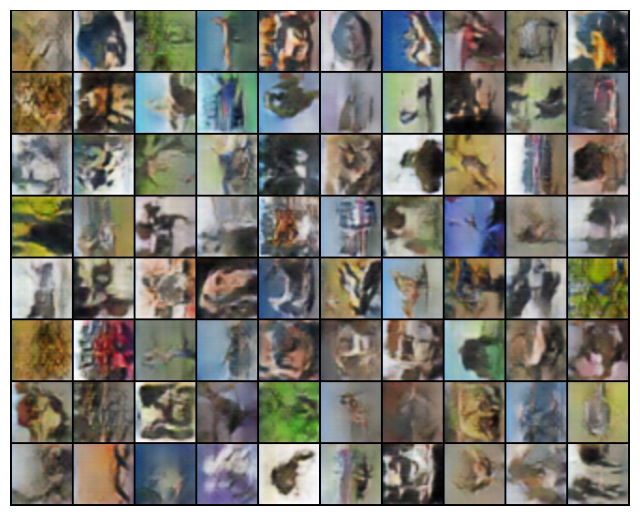

epoch: 29, D_Loss: 0.6547652366368667, G_Loss: 3.104040464171973, Dx: 0.7780514895782599, D_G_x1: 0.12257635577098297, D_G_x2: 0.07877740898744806, FID: 79.20867919921875
epoch: 30, D_Loss: 0.6074203178096, G_Loss: 3.393016481567222, Dx: 0.8009107877950534, D_G_x1: 0.0983732407793517, D_G_x2: 0.054478923748027, FID: 75.13409423828125
epoch: 31, D_Loss: 0.5572684785289228, G_Loss: 3.5524500796709524, Dx: 0.8162844764149707, D_G_x1: 0.08292287936293617, D_G_x2: 0.05071228035354077, FID: 77.58279418945312
epoch: 32, D_Loss: 0.685790883458179, G_Loss: 3.092804899148624, Dx: 0.7769666941231473, D_G_x1: 0.12267645218057077, D_G_x2: 0.07729019051814592, FID: 76.90707397460938
epoch: 33, D_Loss: 0.5070800477129114, G_Loss: 3.648633792577192, Dx: 0.8330795286256639, D_G_x1: 0.06714939976961393, D_G_x2: 0.039958227854853264, FID: 78.38777160644531


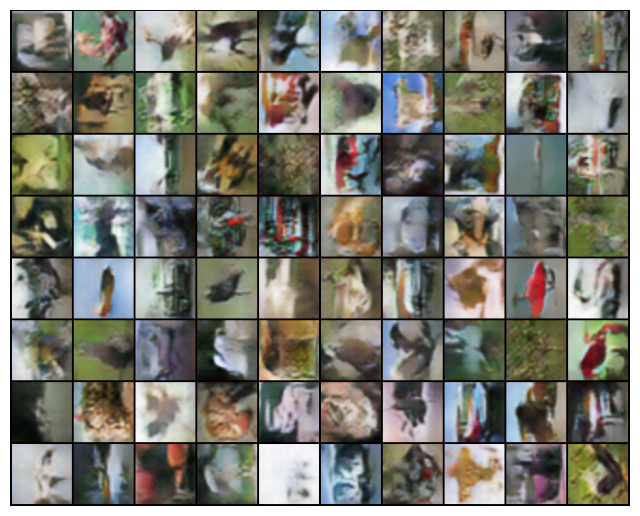

epoch: 34, D_Loss: 0.6574533564202926, G_Loss: 3.2053908323083085, Dx: 0.7836856176443112, D_G_x1: 0.11471252731682346, D_G_x2: 0.07307404843869124, FID: 77.16537475585938
epoch: 35, D_Loss: 0.5893201411837508, G_Loss: 3.434385661883732, Dx: 0.8062151717712812, D_G_x1: 0.09427208464969035, D_G_x2: 0.0539456325941338, FID: 72.71870422363281
epoch: 36, D_Loss: 0.5906837072671222, G_Loss: 3.5906614219898456, Dx: 0.813483015908038, D_G_x1: 0.0864960983685275, D_G_x2: 0.05201289345107763, FID: 76.12199401855469
epoch: 37, D_Loss: 0.5592905039067768, G_Loss: 3.3977869865686996, Dx: 0.8157080231267778, D_G_x1: 0.08367960878393, D_G_x2: 0.05422373673886947, FID: 75.73680114746094
epoch: 38, D_Loss: 0.5749466065555582, G_Loss: 3.3952432992818107, Dx: 0.8115315500937421, D_G_x1: 0.08831779210997359, D_G_x2: 0.05681105384930952, FID: 75.40589904785156


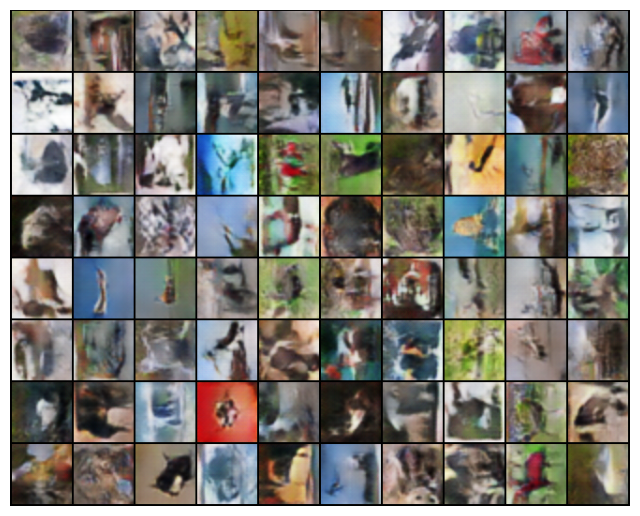

epoch: 39, D_Loss: 0.6017331953548715, G_Loss: 3.3717778105565044, Dx: 0.8021100201570165, D_G_x1: 0.09708921745231332, D_G_x2: 0.05810874495524294, FID: 73.42060852050781
epoch: 40, D_Loss: 0.5832754240926269, G_Loss: 3.369923865551229, Dx: 0.8088534985528425, D_G_x1: 0.09157406554624076, D_G_x2: 0.05841230222141928, FID: 74.24250793457031
epoch: 41, D_Loss: 0.5352266000969635, G_Loss: 3.691894180100897, Dx: 0.8266914258603855, D_G_x1: 0.0725229822651214, D_G_x2: 0.04580205361551755, FID: 73.21925354003906
epoch: 42, D_Loss: 0.5449367412520797, G_Loss: 3.5006031160769253, Dx: 0.8242465699105845, D_G_x1: 0.07446881534699637, D_G_x2: 0.0485532049220228, FID: 75.22123718261719
epoch: 43, D_Loss: 0.6839432323832646, G_Loss: 3.0998026406216193, Dx: 0.7732403997493826, D_G_x1: 0.1266080708468638, D_G_x2: 0.083281025549223, FID: 74.07876586914062


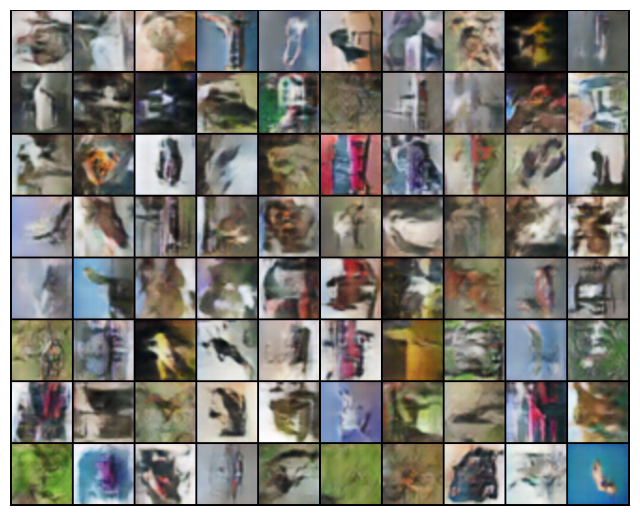

epoch: 44, D_Loss: 0.566410280478275, G_Loss: 3.3271491352249596, Dx: 0.8109075743943224, D_G_x1: 0.08984456895529043, D_G_x2: 0.058784216101986385, FID: 74.87997436523438
epoch: 45, D_Loss: 0.5738603252431621, G_Loss: 3.434144099959937, Dx: 0.811531474435097, D_G_x1: 0.08820918275241661, D_G_x2: 0.056937520645836924, FID: 72.18324279785156
epoch: 46, D_Loss: 0.5683309813899458, G_Loss: 3.4244986400579855, Dx: 0.8133529293472352, D_G_x1: 0.08634675324589605, D_G_x2: 0.05642999658215781, FID: 74.34678649902344
epoch: 47, D_Loss: 0.5834861474726206, G_Loss: 3.3392096625264647, Dx: 0.8071580227902707, D_G_x1: 0.09247499328527047, D_G_x2: 0.06107056430598144, FID: 73.59834289550781
epoch: 48, D_Loss: 0.503515169672344, G_Loss: 3.692901592577815, Dx: 0.8368529218351445, D_G_x1: 0.06340979831352772, D_G_x2: 0.042476995101989344, FID: 74.1397705078125


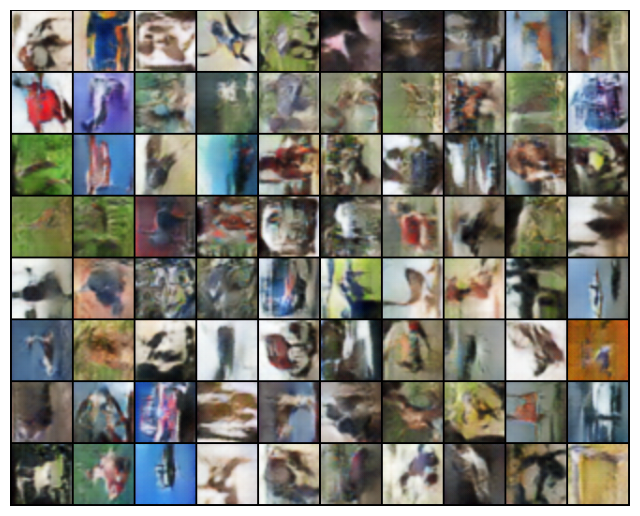

epoch: 49, D_Loss: 0.538024772844656, G_Loss: 3.6616351484795056, Dx: 0.8270940534065446, D_G_x1: 0.07162417861147095, D_G_x2: 0.047331257994064006, FID: 77.3868408203125


In [7]:
# Training Loop
alld, allg, all_imgs, fids = [],[],[], []
for epoch in range(epochs):
    d_real_error, g_error, gen_imgs, dx, d_g_x1, d_g_x2, fid = train(dc_gen, dc_dis, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch)
    print(f'epoch: {epoch}, D_Loss: {sum(d_real_error)/len(d_real_error)}, G_Loss: {sum(g_error)/len(g_error)}, Dx: {sum(dx)/len(dx)}, D_G_x1: {sum(d_g_x1)/len(d_g_x1)}, D_G_x2: {sum(d_g_x2)/len(d_g_x2)}, FID: {fid}')
    alld.extend(d_real_error)
    allg.extend(g_error)
    all_imgs.extend(gen_imgs)
    fids.append(fid)


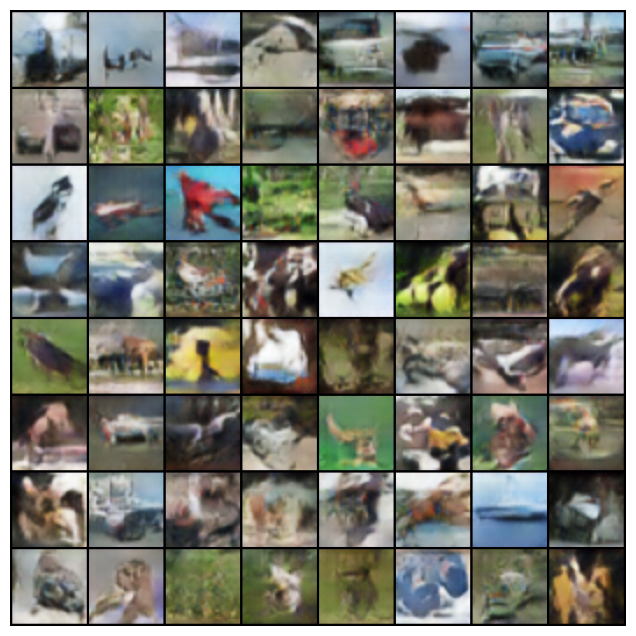

In [8]:
mpl.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
image = [[plt.imshow(np.transpose(i.cpu()[:3], (1,2,0)), animated=True)] for i in all_imgs]
#image = [[plt.imshow(i.cpu(), animated=True)] for i in all_imgs]
ani = animation.ArtistAnimation(fig, image, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [9]:
len(allg)

19550

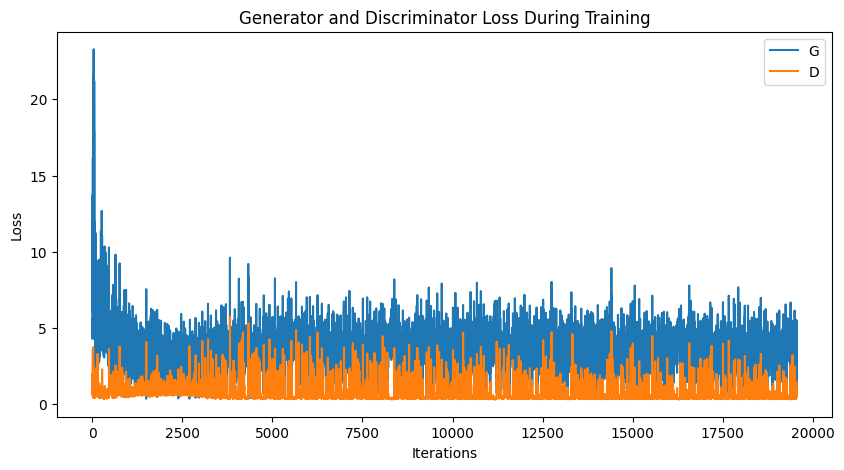

In [10]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(allg,label="G")
plt.plot(alld,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [11]:
torch.save(dc_gen.state_dict(),'dcgan_g.pth')
torch.save(dc_dis.state_dict(), 'dcgan_d.pth')

# dc_gen, dc_dis

torch.Size([1, 100, 1, 1])

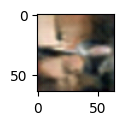

In [12]:
dc_gen.eval()
rando_noise = torch.randn(1,100,1,1)
img = dc_gen(rando_noise.to(device), data[1][0].to(device))
fig = plt.figure(figsize=(1,1))
plt.imshow(np.transpose(vutils.make_grid(img, padding=2, normalize=True).cpu(), (2,1,0)))
#img.cpu().detach()
#np.transpose(img.detach().cpu(), (1,2,0))
#fixed_noise[0,:].unsqueeze(0).shape
torch.full((1,100,1,1), .75 ).shape

In [13]:
gen_imgs[0].shape

torch.Size([3, 530, 530])

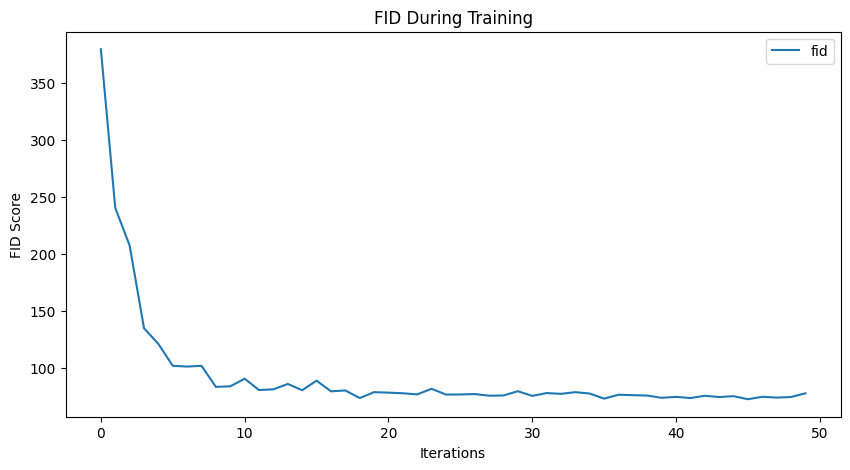

In [14]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("FID During Training")
plt.plot(fids, label='fid')
plt.xlabel("Iterations")
plt.ylabel("FID Score")
plt.legend()
plt.show()

In [15]:
fids

[379.5960693359375,
 240.26280212402344,
 207.18939208984375,
 134.56179809570312,
 120.72637939453125,
 101.54878997802734,
 100.87043762207031,
 101.51744079589844,
 83.02455139160156,
 83.5240478515625,
 90.21849060058594,
 80.23551940917969,
 80.85589599609375,
 85.60255432128906,
 80.08731079101562,
 88.49638366699219,
 79.13587951660156,
 79.88990783691406,
 73.1925048828125,
 78.38401794433594,
 77.96195983886719,
 77.4171142578125,
 76.43612670898438,
 81.34034729003906,
 76.27790832519531,
 76.37278747558594,
 76.72265625,
 75.28106689453125,
 75.48118591308594,
 79.20867919921875,
 75.13409423828125,
 77.58279418945312,
 76.90707397460938,
 78.38777160644531,
 77.16537475585938,
 72.71870422363281,
 76.12199401855469,
 75.73680114746094,
 75.40589904785156,
 73.42060852050781,
 74.24250793457031,
 73.21925354003906,
 75.22123718261719,
 74.07876586914062,
 74.87997436523438,
 72.18324279785156,
 74.34678649902344,
 73.59834289550781,
 74.1397705078125,
 77.3868408203125]

In [16]:
%reset -f